In [1]:
import torch
from torch.utils.data import Dataset, DataLoader
import copy
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from torch import nn, optim
import torch.nn.functional as F
import argparse
import time
from tqdm import tqdm
import os
%matplotlib inline
from sklearn.decomposition import TruncatedSVD
from matplotlib import style

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
sns.set(style='dark')

In [4]:
df=pd.read_csv('fft_normal.csv')
df.head()

,SK_Well,Failure1_CulpritCause,Failure2_CulpritCause,Failure3_CulpritCause,Failure4_CulpritCause,Failure5_CulpritCause,Failure6_CulpritCause,Failure7_CulpritCause,MeasureMRM12,MeasureMRM142,...,MeasureMRM143_fft_real,MeasureMRM143_fft_imag,MeasureMRM187_fft_real,MeasureMRM187_fft_imag,MeasureMRM188_fft_real,MeasureMRM188_fft_imag,MeasureMRM219_fft_real,MeasureMRM219_fft_imag,MeasureMRM204_fft_real,MeasureMRM204_fft_imag
0,0001d449,Механические примеси,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,52.0,18.9,...,8170.200000,-0.000000,48728.300000,-0.000000,16204.000000,-0.000000,7.005743e+06,-0.000000,1971.700000,-0.000000
1,0001d449,Механические примеси,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,52.0,19.0,...,1291.619313,-1335.352455,868.460783,-916.119648,212.657208,-340.857618,-1.190678e+05,111285.292378,1433.964507,938.367918
2,0001d449,Механические примеси,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,51.0,19.2,...,-117.777810,-1290.529646,-32.692478,-867.398337,-216.580337,44.367092,-1.038651e+04,161153.182694,497.119567,907.924700
3,0001d449,Механические примеси,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,51.0,19.4,...,-422.617622,-349.107543,-259.515873,-271.679124,202.779589,-64.545014,1.022281e+05,122528.265353,271.180072,207.572674
4,0001d449,Механические примеси,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,50.0,18.9,...,116.671274,-25.358091,60.397190,-68.596063,231.073352,-71.213199,1.568124e+05,17580.120905,831.043020,-71.459933


In [5]:
anom=pd.read_csv('fft_anomaly.csv')
anom.head()

,SK_Well,Failure1_CulpritCause,Failure2_CulpritCause,Failure3_CulpritCause,Failure4_CulpritCause,Failure5_CulpritCause,Failure6_CulpritCause,Failure7_CulpritCause,MeasureMRM12,MeasureMRM142,...,MeasureMRM143_fft_real,MeasureMRM143_fft_imag,MeasureMRM187_fft_real,MeasureMRM187_fft_imag,MeasureMRM188_fft_real,MeasureMRM188_fft_imag,MeasureMRM219_fft_real,MeasureMRM219_fft_imag,MeasureMRM204_fft_real,MeasureMRM204_fft_imag
0,0001d449,Механические примеси,Коррозионная агрессивность,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,47.0,18.0,...,244.800000,-0.000000,1976.000000,-0.000000,805.300000,-0.000000,2.999700e+05,-0.000000e+00,152.400000,-0.000000
1,0001d449,Механические примеси,Коррозионная агрессивность,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,47.0,17.9,...,-2.757912,0.428062,-2.216844,1.641438,12.668028,46.877992,8.858189e-12,-5.114278e-12,22.900681,-29.965000
2,0001d449,Механические примеси,Коррозионная агрессивность,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,47.0,17.9,...,-2.544316,-0.962410,-0.857920,0.193342,3.416272,20.458722,2.080164e-12,-3.602950e-12,-0.680046,-17.684838
3,0001d449,Механические примеси,Коррозионная агрессивность,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,47.0,17.9,...,-2.396149,-1.242925,-1.544427,-0.433901,1.665905,14.054914,3.029226e-28,-2.799137e-12,15.341079,-3.085964
4,0001d449,Механические примеси,Коррозионная агрессивность,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,46.0,18.0,...,-2.020641,-1.873398,-1.278371,0.005445,0.183523,13.625253,-1.314333e-12,-2.276492e-12,39.784490,-8.116089


In [6]:
df.columns

Index(['SK_Well', 'Failure1_CulpritCause', 'Failure2_CulpritCause',
       'Failure3_CulpritCause', 'Failure4_CulpritCause',
       'Failure5_CulpritCause', 'Failure6_CulpritCause',
       'Failure7_CulpritCause', 'MeasureMRM12', 'MeasureMRM142',
       'MeasureMRM143', 'MeasureMRM187', 'MeasureMRM188', 'MeasureMRM219',
       'daysToFailure', 'MeasureMRM204', 'MeasureMRM12_fft_real',
       'MeasureMRM12_fft_imag', 'MeasureMRM142_fft_real',
       'MeasureMRM142_fft_imag', 'MeasureMRM143_fft_real',
       'MeasureMRM143_fft_imag', 'MeasureMRM187_fft_real',
       'MeasureMRM187_fft_imag', 'MeasureMRM188_fft_real',
       'MeasureMRM188_fft_imag', 'MeasureMRM219_fft_real',
       'MeasureMRM219_fft_imag', 'MeasureMRM204_fft_real',
       'MeasureMRM204_fft_imag'],
      dtype='object')

In [7]:
columns=df.columns

In [8]:
df.shape

(2201368, 30)

In [9]:
time_df=df['daysToFailure']
time_anom=anom['daysToFailure']

In [10]:
df=df[['MeasureMRM12_fft_real',
       'MeasureMRM12_fft_imag', 'MeasureMRM142_fft_real',
       'MeasureMRM142_fft_imag', 'MeasureMRM143_fft_real',
       'MeasureMRM143_fft_imag', 'MeasureMRM187_fft_real',
       'MeasureMRM187_fft_imag', 'MeasureMRM188_fft_real',
       'MeasureMRM188_fft_imag', 'MeasureMRM219_fft_real',
       'MeasureMRM219_fft_imag', 'MeasureMRM204_fft_real',
       'MeasureMRM204_fft_imag']]
anom=anom[['MeasureMRM12_fft_real',
       'MeasureMRM12_fft_imag', 'MeasureMRM142_fft_real',
       'MeasureMRM142_fft_imag', 'MeasureMRM143_fft_real',
       'MeasureMRM143_fft_imag', 'MeasureMRM187_fft_real',
       'MeasureMRM187_fft_imag', 'MeasureMRM188_fft_real',
       'MeasureMRM188_fft_imag', 'MeasureMRM219_fft_real',
       'MeasureMRM219_fft_imag', 'MeasureMRM204_fft_real',
       'MeasureMRM204_fft_imag']]

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2201368 entries, 0 to 2201367
Data columns (total 14 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   MeasureMRM12_fft_real   float64
 1   MeasureMRM12_fft_imag   float64
 2   MeasureMRM142_fft_real  float64
 3   MeasureMRM142_fft_imag  float64
 4   MeasureMRM143_fft_real  float64
 5   MeasureMRM143_fft_imag  float64
 6   MeasureMRM187_fft_real  float64
 7   MeasureMRM187_fft_imag  float64
 8   MeasureMRM188_fft_real  float64
 9   MeasureMRM188_fft_imag  float64
 10  MeasureMRM219_fft_real  float64
 11  MeasureMRM219_fft_imag  float64
 12  MeasureMRM204_fft_real  float64
 13  MeasureMRM204_fft_imag  float64
dtypes: float64(14)
memory usage: 235.1 MB


In [12]:
anom.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 156631 entries, 0 to 156630
Data columns (total 14 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   MeasureMRM12_fft_real   156631 non-null  float64
 1   MeasureMRM12_fft_imag   156631 non-null  float64
 2   MeasureMRM142_fft_real  156631 non-null  float64
 3   MeasureMRM142_fft_imag  156631 non-null  float64
 4   MeasureMRM143_fft_real  156631 non-null  float64
 5   MeasureMRM143_fft_imag  156631 non-null  float64
 6   MeasureMRM187_fft_real  156631 non-null  float64
 7   MeasureMRM187_fft_imag  156631 non-null  float64
 8   MeasureMRM188_fft_real  156631 non-null  float64
 9   MeasureMRM188_fft_imag  156631 non-null  float64
 10  MeasureMRM219_fft_real  156631 non-null  float64
 11  MeasureMRM219_fft_imag  156631 non-null  float64
 12  MeasureMRM204_fft_real  156631 non-null  float64
 13  MeasureMRM204_fft_imag  156631 non-null  float64
dtypes: float64(14)
memor

In [13]:
df.shape, anom.shape

((2201368, 14), (156631, 14))

In [14]:
# tsvd2D = TruncatedSVD(n_components=3)
# tsvd2D.fit(df)
# df_SVD=pd.DataFrame(tsvd2D.transform(df))

In [15]:
# anomalies_SVD = pd.DataFrame(tsvd2D.transform(anom))

In [16]:
# # Установка стиля Seaborn v0.8
# sns.set(style='dark')

# # Создание фигуры и осей
# fig, ax = plt.subplots(figsize=(8, 6))

# # Построение точек аномальных данных
# ax.scatter(anomalies_SVD.values[:, 0], anomalies_SVD.values[:, 1], color='red', label='Anomalies', alpha=0.5)

# # Построение точек чистых данных
# ax.scatter(df_SVD.values[:, 0], df_SVD.values[:, 1], color='green', label='Normal', alpha=0.5)

# # Добавление легенды
# ax.legend()

# # Установка заголовка и меток осей
# ax.set_title('Anomalies and Normal Data', fontsize=16)
# ax.set_xlabel('X1', fontsize=14)
# ax.set_ylabel('X2', fontsize=14)

# # Отображение графика
# plt.show()

In [17]:
columns=df.columns

In [18]:
from sklearn.preprocessing import MinMaxScaler

# Создаем экземпляр MinMaxScaler
scaler = MinMaxScaler()

# Нормализуем данные в датафрейме X
df = pd.DataFrame(scaler.fit_transform(df), columns=columns)
anom=pd.DataFrame(scaler.fit_transform(anom), columns=columns)

In [19]:
# style.use('ggplot')

# fig = plt.figure(figsize=(12, 8))
# ax = fig.add_subplot(111, projection='3d')

# ax.scatter(df[0], df[1], df[2], c='blue', label='df')

# ax.scatter(anom[0], anom[1], anom[2], c='red', label='anomalies')

# ax.set_xlabel('X 1')
# ax.set_ylabel('X 2')
# ax.set_zlabel('X 3')
# ax.legend()
# # plt.savefig('3dplot.png', dpi=300)
# plt.show()

In [20]:
# for i in df.columns:
#     plt.figure()
#     plt.title(f"{i}")
#     plt.plot((df_fft[i]), c='blueviolet', label='FFT')
#     plt.plot(df[i], c='orange', label='original')
#     plt.title(f"Lineplot for {i}")
#     plt.legend()
#     plt.xlabel("Frequency Bins")
#     plt.ylabel("Amplitude")
#     plt.show()

In [21]:
class encdataset(Dataset):
    def __init__(self, data, seq_len=1, batch_size=128):
        # data load
        self.data = data
        self.features = self.data.values.astype(np.float32)
        self.n_samples, self.n_features = self.data.shape
        self.seq_len = seq_len
        self.train_df = self.data[0:2000000]
        self.val_df = self.data[2000000:]
        
        # создание датасета
        self.train_dataset = self.create_dataset(self.train_df, batch_size)
        self.val_dataset = self.create_dataset(self.val_df, batch_size)

    def create_dataset(self, data, batch_size):
        sequences = []
        for i in range(len(data) - self.seq_len + 1):
            sequence = data[i:i+self.seq_len].values  # Изменение здесь
            sequences.append(torch.from_numpy(sequence))
        dataset = DataLoader(sequences, batch_size=batch_size, shuffle=False)
        return dataset

    def __getitem__(self, index):
        return self.data.iloc[index]

    def __len__(self):
        return self.n_samples


In [22]:
dataset = encdataset(df)
train_loader = dataset.train_dataset
val_loader = dataset.val_dataset
seq_len = dataset.seq_len
n_features = dataset.n_features

In [23]:
# for batch in train_loader:
#     print(batch)
#     print(batch.shape)

In [24]:
seq_len

1

In [25]:
n_features

14

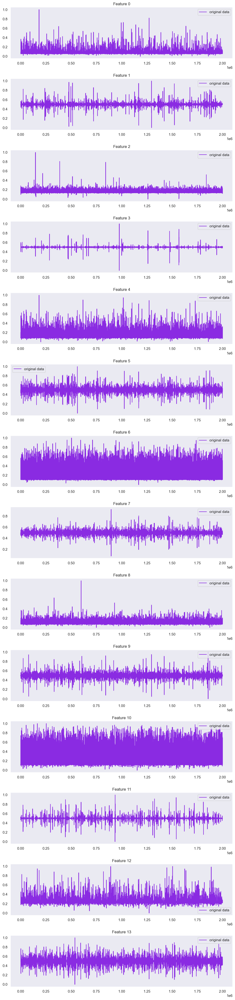

In [26]:
# 1. Извлечь данные из train_loader в виде numpy массива
train_data = []
for batch in train_loader:
    batch = batch.squeeze(1)  # убираем лишнее измерение
    batch = batch.numpy()  # преобразуем в numpy array
    for seq in batch:
        train_data.append(seq)
train_data = np.array(train_data)

# 2. Перестроить данные в подходящий формат для построения графиков
train_data = train_data.reshape(-1, seq_len, n_features)

# 3. Создать подграфики для каждой фичи
fig, axs = plt.subplots(n_features, 1, figsize=(10, n_features * 3))

# 4. Построить график для каждой фичи
for i in range(n_features):
    line, = axs[i].plot(train_data[:, 0, i], color='blueviolet', label='original data')
    for j in range(1, seq_len):
        axs[i].plot(train_data[:, j, i], color='blueviolet')
    axs[i].set_title(f'Feature {i}')
    axs[i].legend(handles=[line])  # Добавить легенду

plt.tight_layout()
plt.show()

In [27]:
seed = 42
np.random.seed(seed)
torch.manual_seed(seed)

parser = argparse.ArgumentParser()
args = parser.parse_args('')

args.device = 'cuda' if torch.cuda.is_available() else 'cpu'

# ===== data loading ==== #
args.batch_size = 128

# ==== model capacity ==== #
args.n_layers = 1
args.embedding_dim = 128


# ==== regularization ==== #
# args.dropout = 0  # Установка значения dropout
args.use_bn = False  # batch normalization

# ==== optimizer & training  # ====
args.lr = 0.001
args.epoch = 180
args.patience = 20

In [28]:
class Encoder(nn.Module):
    def __init__(self, seq_len, n_features, args):
        super(Encoder, self).__init__()
        self.seq_len, self.n_features = seq_len, n_features
        self.hidden_dim = 2 * args.embedding_dim
        self.lstm1 = nn.LSTM(
            input_size=n_features,
            hidden_size=self.hidden_dim,
            num_layers=args.n_layers,
            batch_first=True,
            dtype=torch.float32
        ).to(args.device)
        self.lstm2 = nn.LSTM(
            input_size=self.hidden_dim,
            hidden_size=args.embedding_dim,
            num_layers=args.n_layers,
            batch_first=True,
            dtype=torch.float32
        ).to(args.device)

    def forward(self, x):
        x = x.to(args.device).to(torch.float32)
        batch_size = x.size(0)

        # print(f'ENCODER input dim: {x.shape}')
        x = x.reshape((batch_size, self.seq_len, self.n_features))
        # print(f'ENCODER reshaped dim: {x.shape}')
        x, (_, _) = self.lstm1(x)
        # print(f'ENCODER output lstm1 dim: {x.shape}')
        x, (hidden_n, _) = self.lstm2(x)
        # print(f'ENCODER output lstm2 dim: {x.shape}')
        # print(f'ENCODER hidden_n lstm2 dim: {hidden_n.shape}')
        # print(f'ENCODER hidden_n wants to be reshaped to : {(batch_size, args.embedding_dim)}')
        return hidden_n.reshape((batch_size, args.embedding_dim))

class Decoder(nn.Module):
    def __init__(self, seq_len, n_features, args):
        super(Decoder, self).__init__()
        self.seq_len, self.input_dim = seq_len, args.embedding_dim
        self.hidden_dim, self.n_features = 2 * args.embedding_dim, n_features
        self.lstm1 = nn.LSTM(
            input_size=args.embedding_dim,
            hidden_size=args.embedding_dim,
            num_layers=1,
            batch_first=True
        ).to(args.device)
        self.lstm2 = nn.LSTM(
            input_size=args.embedding_dim,
            hidden_size=self.hidden_dim,
            num_layers=1,
            batch_first=True
        ).to(args.device)
        self.output_layer = nn.Linear(self.hidden_dim, n_features).to(args.device)

    def forward(self, x):
        batch_size = x.size(0)
        x = x.to(args.device)
        # print(f'DECODER input dim: {x.shape}')
        x = x.repeat_interleave(self.seq_len, dim=0)
        # print(f'DECODER repeat dim: {x.shape}')
        x = x.reshape((batch_size, self.seq_len, self.input_dim))
        # print(f'DECODER reshaped dim: {x.shape}')
        x, (hidden_n, cell_n) = self.lstm1(x)
        # print(f'DECODER output rnn1 dim:/ {x.shape}')
        x, (hidden_n, cell_n) = self.lstm2(x)
        x = x.reshape((batch_size, self.seq_len, self.hidden_dim))
        return self.output_layer(x)

class LSTM_AUTO_ENCODER(nn.Module):
    def __init__(self, seq_len, n_features, args):
        super(LSTM_AUTO_ENCODER, self).__init__()
        self.seq_len = seq_len
        self.n_features = n_features
        self.encoder = Encoder(seq_len, n_features, args)
        self.decoder = Decoder(seq_len, n_features, args)

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


In [29]:
class EarlyStopping:
    def __init__(self, patience=20, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss > self.best_loss + self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_loss = val_loss
            self.counter = 0

Проверка работоспособности модели

In [30]:
# encoder = Encoder(seq_len, n_features)

# for batch in train_loader:
#     output = encoder(batch)
#     print(f'Input shape: {batch.shape}')
#     print(f'Output shape: {output.shape}')
#     print('-' * 30)


In [31]:
# decoder = Decoder(seq_len, n_features)

# for batch in train_loader:
#     input_tensor = torch.randn(batch.size(0), args.embedding_dim)  # Создаем случайный входной тензор для декодера
#     output = decoder(input_tensor)
#     print(f'Input shape: {input_tensor.shape}')
#     print(f'Output shape: {output.shape}')
#     print('-' * 30)
#     break  # Выходим из цикла после первой итерации

In [32]:
# model = LSTM_AUTO_ENCODER(seq_len, n_features, args)

# for batch in train_loader:
#     input_tensor = batch
#     output = model(input_tensor)
#     print(f'Input shape: {input_tensor.shape}')
#     print(f'Output shape: {output.shape}')
#     print('-' * 30)
#     break

In [33]:
def train_model(model,train_loader, val_loader, n_epochs, n_features, args):
    early_stopping = EarlyStopping(patience=args.patience)
    # Установка режима обучения
    model.train()
    
    # Оптимизатор и функция потерь
    optimizer = torch.optim.Adam(model.parameters(), lr=args.lr)
    criterion = nn.MSELoss(reduction='sum').to(args.device)

    # История обучения
    history = {'train': [], 'val': []}

    # Переменная для отслеживания лучшей модели
    best_model_wts = None
    best_val_loss = float('inf')

    # Цикл обучения
    for epoch in range(1, n_epochs + 1):
        model = model.train()
        ts = time.time()
        train_losses = []

        # Создание DataLoader для обучающего набора данных
        train_loader = DataLoader(train_data, batch_size=args.batch_size, shuffle=False)
        train_loader = tqdm(train_loader, desc=f'Epoch {epoch}', leave=False)

        for seq_true in train_loader:
            optimizer.zero_grad()

            # Изменение формы входных данных на (batch_size, seq_len, n_features)
            seq_true = seq_true.reshape((-1, seq_len, n_features))
            seq_true = seq_true.float().to(args.device)

            seq_pred = model(seq_true)
    
            loss = criterion(seq_pred, seq_true)
            
            loss.backward()
            optimizer.step()

            train_losses.append(loss.item())
            # Обновление tqdm
            train_loader.set_postfix(train_loss=np.mean(train_losses))

        val_losses = []
        model = model.eval()
        with torch.no_grad():
            for seq_true in val_loader:

                # Изменение формы входных данных на (batch_size, seq_len, n_features)
                seq_true = seq_true.reshape((-1, seq_len, n_features))
                seq_true = seq_true.float().to(args.device)

                seq_pred = model(seq_true)

                loss = criterion(seq_pred, seq_true)

                val_losses.append(loss.item())
        te = time.time()
        train_loss = np.mean(train_losses)
        val_loss = np.mean(val_losses)
        history['train'].append(train_loss)
        history['val'].append(val_loss)
        
        # Вызов EarlyStopping и проверка на необходимость остановки
        early_stopping(val_loss)
        if early_stopping.early_stop:
            print(f"Early stopping at epoch {epoch}")
            break
        
        print(f"Epoch: {epoch}  train loss: {train_loss}  val loss: {val_loss}  time: {te-ts} ")
        # Построение графиков каждые 10 эпох
        if epoch % 10 == 0:
            # 1. Извлечь данные из val_loader в виде numpy массива
            val_data_np = torch.cat([batch for batch in val_loader], dim=0).detach().cpu().numpy()

            # 2. Перестроить данные в подходящий формат для построения графиков
            val_data_np = val_data_np.reshape(-1, seq_len, n_features)

            # 3. Получить предсказания модели
            preds = []
            with torch.no_grad():
                model = model.eval()
                for seq_true in val_loader:
                    seq_true = seq_true.to(args.device)
                    seq_true = seq_true.reshape((-1, seq_len, n_features))

                    seq_pred = model(seq_true)
                    preds.append(seq_pred.cpu().numpy())
            preds = np.concatenate(preds, axis=0)

            # 4. Создать подграфики для каждой фичи
            fig, axs = plt.subplots(n_features, 1, figsize=(10, n_features * 3))

            # 5. Построить график для каждой фичи
            for i in range(n_features):
                line1, = axs[i].plot(val_data_np[:, 0, i], color='blueviolet', label='original data')

                line2, = axs[i].plot(preds[:, 0, i], color='orange', label='predictions')
                for j in range(1, seq_len):
                    axs[i].plot(val_data_np[:, j, i], color='blueviolet')
                    axs[i].plot(preds[:, j, i], color='orange')
                axs[i].set_title(f'Feature {i}')
                axs[i].legend(handles=[line1, line2])

            plt.tight_layout()
            plt.show()

        # Сохранение лучшей модели
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_wts = copy.deepcopy(model.state_dict())

    # Загрузка весов лучшей модели
    model.load_state_dict(best_model_wts)

    return model.eval(), history


In [34]:
model = LSTM_AUTO_ENCODER(seq_len=seq_len, n_features=n_features, args=args)
model = model.to(args.device)
model

LSTM_AUTO_ENCODER(
  (encoder): Encoder(
    (lstm1): LSTM(14, 256, batch_first=True)
    (lstm2): LSTM(256, 128, batch_first=True)
  )
  (decoder): Decoder(
    (lstm1): LSTM(128, 128, batch_first=True)
    (lstm2): LSTM(128, 256, batch_first=True)
    (output_layer): Linear(in_features=256, out_features=14, bias=True)
  )
)

Epoch: 1  train loss: 0.285520295283176  val loss: 0.023479517888759405  time: 147.56652450561523 


Epoch: 2  train loss: 0.023767189145990648  val loss: 0.01010011188023791  time: 146.3372733592987 


Epoch: 3  train loss: 0.015715340534442103  val loss: 0.008715516295913594  time: 145.3526735305786 


Epoch: 4  train loss: 0.012571917254718953  val loss: 0.006252615359971854  time: 145.12162494659424 


Epoch: 5  train loss: 0.0091093887143787  val loss: 0.005479294816555699  time: 146.2738790512085 


Epoch: 6  train loss: 0.0071420301112832965  val loss: 0.004803137390742971  time: 146.28249645233154 


Epoch: 7  train loss: 0.006323813609603327  val loss: 0.003377284134081074  time: 146.46411061286926 


Epoch: 8  train loss: 0.00465620830700756  val loss: 0.002185557482525525  time: 147.05461716651917 


Epoch: 9  train loss: 0.0035601909976880996  val loss: 0.0016123874108082221  time: 147.24007940292358 


Epoch: 10  train loss: 0.0030697253423791846  val loss: 0.0008421524764975196  time: 165.7396056652069 


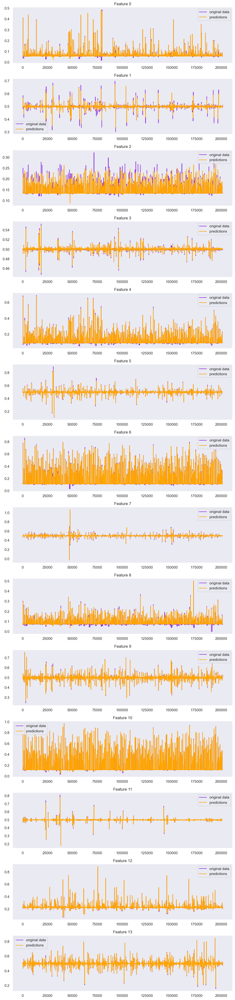

Epoch: 11  train loss: 0.0022050631511679386  val loss: 0.00071767780492063  time: 147.8444721698761 


Epoch: 12  train loss: 0.0019506136000467232  val loss: 0.0006213352693731629  time: 143.10873293876648 


Epoch: 13  train loss: 0.002166961326718505  val loss: 0.0006517918938150354  time: 142.99160385131836 


Epoch: 14  train loss: 0.0016367854980567935  val loss: 0.0005699742135069341  time: 142.9967315196991 


Epoch: 15  train loss: 0.0012310126393386162  val loss: 0.0005079214866548982  time: 143.5748643875122 


Epoch: 16  train loss: 0.0009673544928702176  val loss: 0.0003617803650871413  time: 145.4851586818695 


Epoch: 17  train loss: 0.000907659629291622  val loss: 0.00039617865021644385  time: 146.8940110206604 


Epoch: 18  train loss: 0.0008597254213751875  val loss: 0.0004128044361367395  time: 146.75597739219666 


Epoch: 19  train loss: 0.0008532554561342695  val loss: 0.0003056675366591144  time: 147.0615680217743 


Epoch: 20  train loss: 0.0007827747559121926  val loss: 0.00035779841186142506  time: 147.24868822097778 


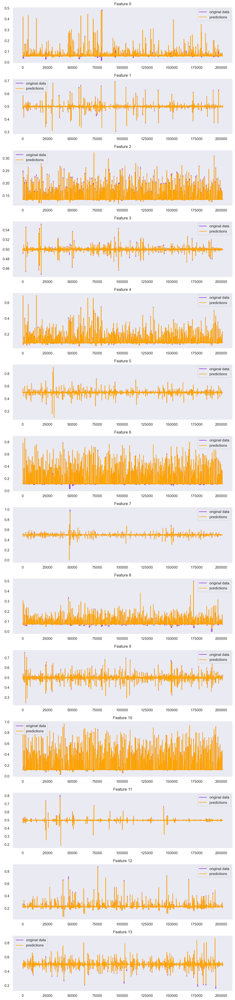

Epoch: 21  train loss: 0.0006538913970151916  val loss: 0.000251208555406101  time: 143.91409587860107 


Epoch: 22  train loss: 0.0006556634647294996  val loss: 0.00021227211295560492  time: 143.17782020568848 


Epoch: 23  train loss: 0.0006515842037468683  val loss: 0.00019080441809853118  time: 143.1559739112854 


Epoch: 24  train loss: 0.0005839443894784199  val loss: 0.00018930589671340196  time: 142.8334858417511 


Epoch: 25  train loss: 0.0005378039435851387  val loss: 0.00022751023434501003  time: 143.09802770614624 


Epoch: 26  train loss: 0.0005212269021379179  val loss: 0.00012873130467833547  time: 143.93646812438965 


Epoch: 27  train loss: 0.0005046596736233332  val loss: 0.00016310435222933545  time: 143.36494398117065 


Epoch: 28  train loss: 0.0004694258890338824  val loss: 0.0001276087461619023  time: 143.51062989234924 


Epoch: 29  train loss: 0.0004888748164587887  val loss: 0.00020146519147724293  time: 143.2705521583557 


Epoch: 30  train loss: 0.00045031275772221854  val loss: 0.00025827793605293027  time: 143.79649257659912 


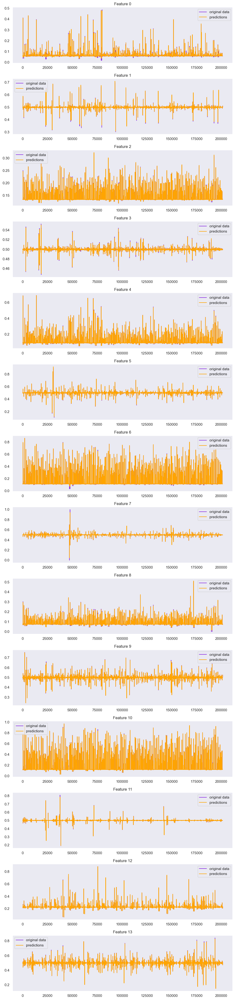

Epoch: 31  train loss: 0.0004362170819373278  val loss: 0.00011955718066615786  time: 143.57510018348694 


Epoch: 32  train loss: 0.0004484705950533098  val loss: 0.00014719893715780077  time: 143.7768714427948 


Epoch: 33  train loss: 0.00039638567824548226  val loss: 0.00016848317265318887  time: 143.63016486167908 


Epoch: 34  train loss: 0.0003976194058659312  val loss: 0.0001581820734634495  time: 143.9059498310089 


Epoch: 35  train loss: 0.0003646114777986077  val loss: 0.00014439627946169877  time: 143.43500757217407 


Epoch: 36  train loss: 0.00034433110475202554  val loss: 8.674052798430263e-05  time: 143.2171277999878 


Epoch: 37  train loss: 0.0003442937023580016  val loss: 0.00016535735107618685  time: 143.53105759620667 


Epoch: 38  train loss: 0.0003469182506906218  val loss: 0.00011949858718187509  time: 143.09474086761475 


Epoch: 39  train loss: 0.00032131752710246655  val loss: 0.00013873639845642382  time: 143.6415786743164 


Epoch: 40  train loss: 0.0003690441658034979  val loss: 0.0001736667643465864  time: 142.99530029296875 


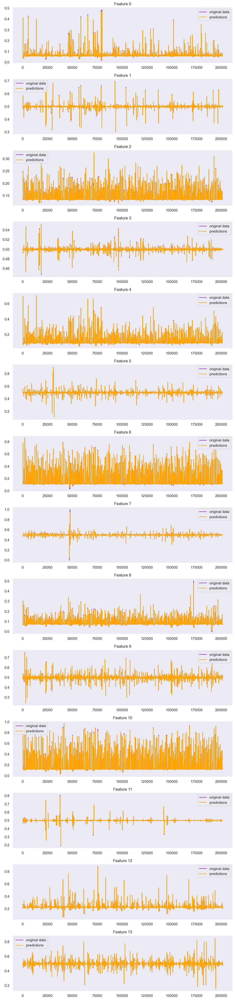

Epoch: 41  train loss: 0.0003095260999518796  val loss: 0.00013969771039615506  time: 145.21486973762512 


Epoch: 42  train loss: 0.0003150881035955972  val loss: 0.00014821854877688972  time: 145.80100679397583 


Epoch: 43  train loss: 0.00028963564794005654  val loss: 7.410683232063132e-05  time: 145.4755504131317 


Epoch: 44  train loss: 0.00032496742805132817  val loss: 0.00012997936954596776  time: 146.00338912010193 


Epoch: 45  train loss: 0.00029597800922056194  val loss: 0.00021129634888273052  time: 146.42482471466064 


Epoch: 46  train loss: 0.0002872715315675596  val loss: 0.0002352906067059572  time: 146.39789271354675 


Epoch: 47  train loss: 0.00028029111539271253  val loss: 0.00011690952256798959  time: 145.83432865142822 


Epoch: 48  train loss: 0.00026528840379338363  val loss: 7.775660918833536e-05  time: 145.60140180587769 


Epoch: 49  train loss: 0.00026855775677152267  val loss: 0.00010204775446261578  time: 146.60016751289368 


Epoch: 50  train loss: 0.0002661347034229693  val loss: 5.6438608191347664e-05  time: 146.36867427825928 


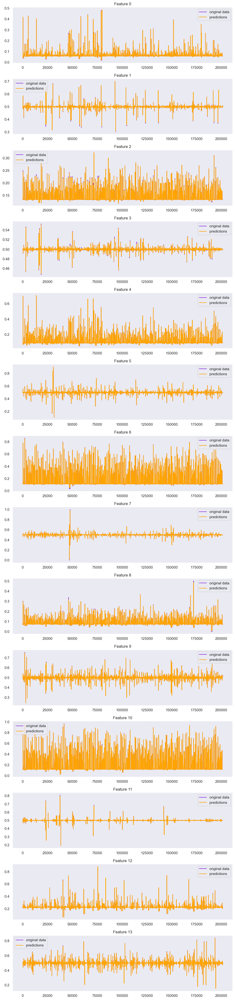

Epoch: 51  train loss: 0.0002542922050711641  val loss: 9.093899018829818e-05  time: 144.4971480369568 


Epoch: 52  train loss: 0.00028408896354441824  val loss: 0.00011197317487247652  time: 144.10110330581665 


Epoch: 53  train loss: 0.0002632397249432688  val loss: 0.00013404980562982516  time: 143.989572763443 


Epoch: 54  train loss: 0.0002610713312352309  val loss: 8.620177121799536e-05  time: 144.0050449371338 


Epoch: 55  train loss: 0.00025506786845515305  val loss: 6.857616329755392e-05  time: 143.69680857658386 


Epoch: 56  train loss: 0.00024359388985323313  val loss: 6.37324279561591e-05  time: 143.94087886810303 


Epoch: 57  train loss: 0.0002506312449097313  val loss: 0.00011168225081061343  time: 144.95139360427856 


Epoch: 58  train loss: 0.000247222500423537  val loss: 0.0001355533977298948  time: 144.67840147018433 


Epoch: 59  train loss: 0.0002299144430635788  val loss: 0.00015184593841344142  time: 144.4870343208313 


Epoch: 60  train loss: 0.00024162458677883843  val loss: 8.181019161886736e-05  time: 143.96195340156555 


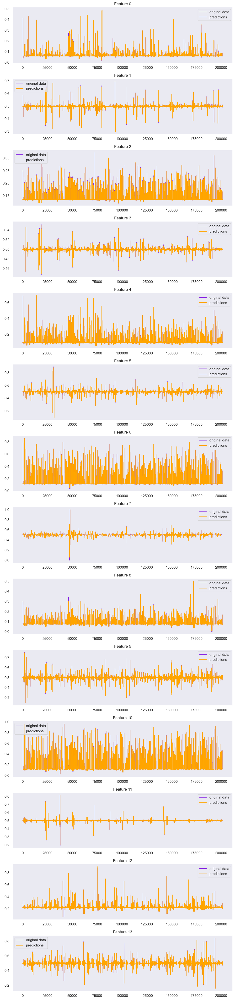

Epoch: 61  train loss: 0.00023523640470642568  val loss: 5.673240403878052e-05  time: 144.69735097885132 


Epoch: 62  train loss: 0.00022890589181680116  val loss: 8.541829347646863e-05  time: 143.8786587715149 


Epoch: 63  train loss: 0.0002915530800137058  val loss: 8.322532528367553e-05  time: 144.04457569122314 


Epoch: 64  train loss: 0.00022161329782514804  val loss: 6.540256576740766e-05  time: 144.49466919898987 


Epoch: 65  train loss: 0.00022375991066574352  val loss: 4.34484770034e-05  time: 144.42697048187256 


Epoch: 66  train loss: 0.0002164901352293964  val loss: 0.00015359302704999686  time: 144.0750982761383 


Epoch: 67  train loss: 0.00022509971710003447  val loss: 8.520342604887466e-05  time: 144.1623260974884 


Epoch: 68  train loss: 0.0002146021408128072  val loss: 4.6566413767800236e-05  time: 144.49146676063538 


Epoch: 69  train loss: 0.00023274068386451837  val loss: 0.00013469675592052476  time: 144.1578586101532 


Epoch: 70  train loss: 0.00021337878436397296  val loss: 5.498776913485709e-05  time: 144.35346293449402 


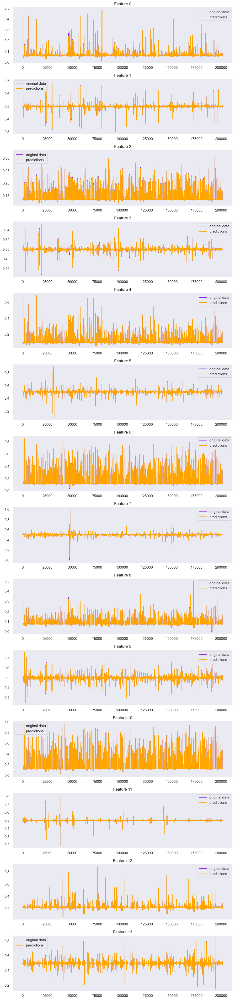

Epoch: 71  train loss: 0.00022729136504329652  val loss: 4.6384530039813515e-05  time: 144.86424922943115 


Epoch: 72  train loss: 0.00020648764516218216  val loss: 4.53174325599873e-05  time: 144.5916600227356 


Epoch: 73  train loss: 0.00020751029304869007  val loss: 9.343819344534267e-05  time: 144.38620591163635 


Epoch: 74  train loss: 0.00020236508672277705  val loss: 0.00014019635463132123  time: 144.45781755447388 


Epoch: 75  train loss: 0.00021352848842450475  val loss: 4.683770991500676e-05  time: 146.92569780349731 


Epoch: 76  train loss: 0.00020097105630460284  val loss: 7.827670227627253e-05  time: 145.1916241645813 


Epoch: 77  train loss: 0.00021909649653958333  val loss: 9.598357308605831e-05  time: 144.85288429260254 


Epoch: 78  train loss: 0.00019669149293583178  val loss: 0.00019667876582560035  time: 144.53317642211914 


Epoch: 79  train loss: 0.00021155846783203015  val loss: 0.00019067592638355544  time: 144.72177958488464 


Epoch: 80  train loss: 0.0002016017516196007  val loss: 6.407211653123576e-05  time: 144.85337901115417 


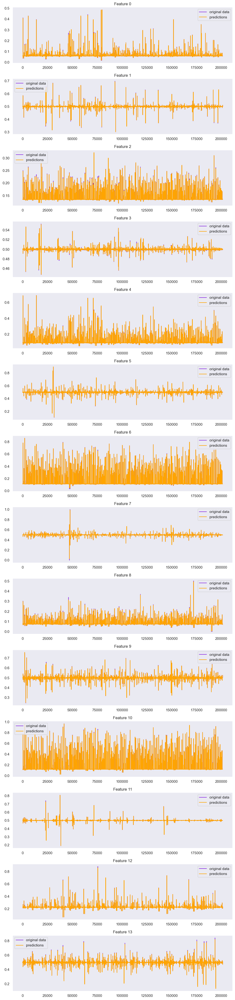

Epoch: 81  train loss: 0.00021351557650917675  val loss: 8.16112967025565e-05  time: 145.50472021102905 


Epoch: 82  train loss: 0.00019389847651020683  val loss: 9.119070981827742e-05  time: 144.80846667289734 


Epoch: 83  train loss: 0.0002104833879901489  val loss: 5.7239091792507215e-05  time: 144.0844066143036 


Epoch: 84  train loss: 0.00019000959977439198  val loss: 5.430295506553534e-05  time: 144.17561173439026 


Epoch: 85  train loss: 0.00019097645764573826  val loss: 4.104388059779724e-05  time: 143.68659853935242 


Epoch: 86  train loss: 0.00018871032422752615  val loss: 3.6319605003401566e-05  time: 143.8730206489563 


Epoch: 87  train loss: 0.0002099615104782424  val loss: 0.00015387676321921943  time: 144.05657696723938 


Epoch: 88  train loss: 0.00018813666222913526  val loss: 0.00010402994715830948  time: 144.2547926902771 


Epoch: 89  train loss: 0.0001926434067484297  val loss: 4.565901803447631e-05  time: 144.31410431861877 


Epoch: 90  train loss: 0.000185429057338908  val loss: 6.0923461345508636e-05  time: 144.1860761642456 


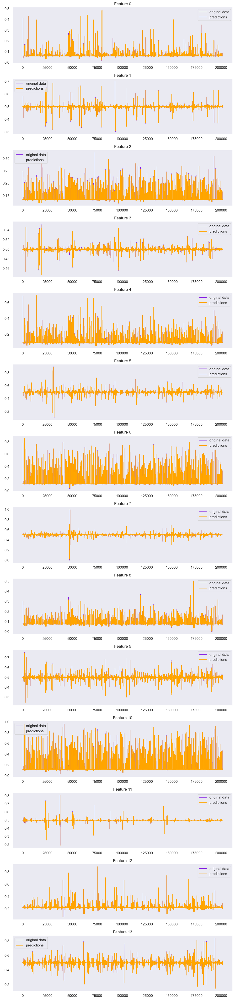

Epoch: 91  train loss: 0.00021519245902147668  val loss: 5.7230882120994515e-05  time: 145.21348357200623 


Epoch: 92  train loss: 0.00018634793979124516  val loss: 4.5763727341003976e-05  time: 144.48437237739563 


Epoch: 93  train loss: 0.0001976571818130469  val loss: 8.000000315979844e-05  time: 144.2497398853302 


Epoch: 94  train loss: 0.00018609095262374467  val loss: 5.798160607583625e-05  time: 144.57279586791992 


Epoch: 95  train loss: 0.00020215459255044699  val loss: 9.54674050640735e-05  time: 145.3355565071106 


Epoch: 96  train loss: 0.00018226112205478422  val loss: 4.5352215865320026e-05  time: 144.41437005996704 


Epoch: 97  train loss: 0.0001910728463753112  val loss: 7.122149660765493e-05  time: 144.57377362251282 


Epoch: 98  train loss: 0.00018007379924117413  val loss: 3.385913635575534e-05  time: 144.9890809059143 


Epoch: 99  train loss: 0.000192314803406196  val loss: 0.0001009202722036214  time: 145.19012236595154 


Epoch: 100  train loss: 0.00017641131705851875  val loss: 7.278356812438372e-05  time: 145.9009141921997 


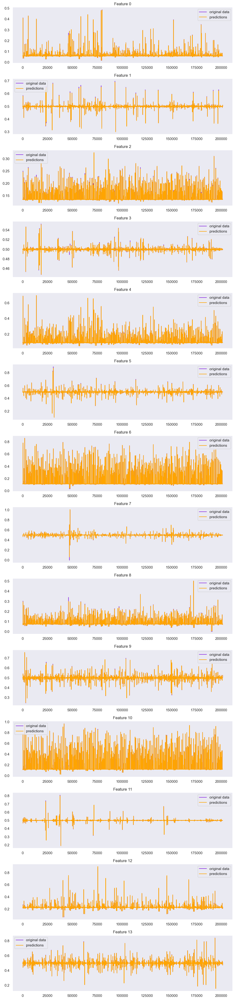

Epoch: 101  train loss: 0.00019003195182968192  val loss: 0.00010745975531370964  time: 146.21752047538757 


Epoch: 102  train loss: 0.00017240348620359145  val loss: 5.4418350713791226e-05  time: 145.20331859588623 


Epoch: 103  train loss: 0.00019062678860639424  val loss: 5.541501690917764e-05  time: 145.63207244873047 


Epoch: 104  train loss: 0.000171122988401803  val loss: 6.329355684186119e-05  time: 145.49188828468323 


Epoch: 105  train loss: 0.00019691530250630604  val loss: 9.753583091746937e-05  time: 144.75255942344666 


Epoch: 106  train loss: 0.00017192673430679861  val loss: 6.86314204305336e-05  time: 145.38614773750305 


Epoch: 107  train loss: 0.00018222996909429638  val loss: 9.549137036965256e-05  time: 145.55978918075562 


Epoch: 108  train loss: 0.00017617863204048625  val loss: 0.0002118577720667502  time: 144.9875361919403 


Epoch: 109  train loss: 0.00017407610297042993  val loss: 6.431438871161671e-05  time: 145.42863965034485 


Epoch: 110  train loss: 0.00016836877131139045  val loss: 3.0854103466236324e-05  time: 145.64604496955872 


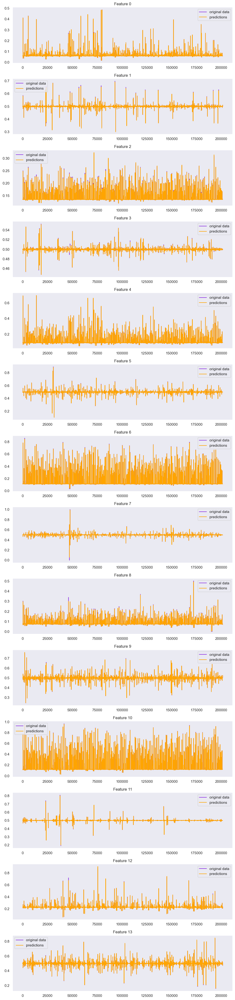

Epoch: 111  train loss: 0.00017833172706396727  val loss: 3.214259294433552e-05  time: 146.2370843887329 


Epoch: 112  train loss: 0.00016534110305451032  val loss: 6.27707315468998e-05  time: 145.8123757839203 


Epoch: 113  train loss: 0.00018071539823924832  val loss: 5.380034000885935e-05  time: 145.67593693733215 


Epoch: 114  train loss: 0.0001641177081705937  val loss: 2.4411322025891396e-05  time: 145.4489929676056 


Epoch: 115  train loss: 0.00017784254097675875  val loss: 6.607160426485194e-05  time: 145.36612796783447 


Epoch: 116  train loss: 0.00016213747879587027  val loss: 4.44551189691766e-05  time: 145.47903108596802 


Epoch: 117  train loss: 0.0001786128041024349  val loss: 5.402422343020132e-05  time: 145.48264908790588 


Epoch: 118  train loss: 0.00015867123162698407  val loss: 3.545756040056042e-05  time: 145.44931364059448 


Epoch: 119  train loss: 0.00017262863599130652  val loss: 5.310995493461691e-05  time: 145.47016620635986 


Epoch: 120  train loss: 0.0001544628287028754  val loss: 3.342174866631913e-05  time: 146.03891801834106 


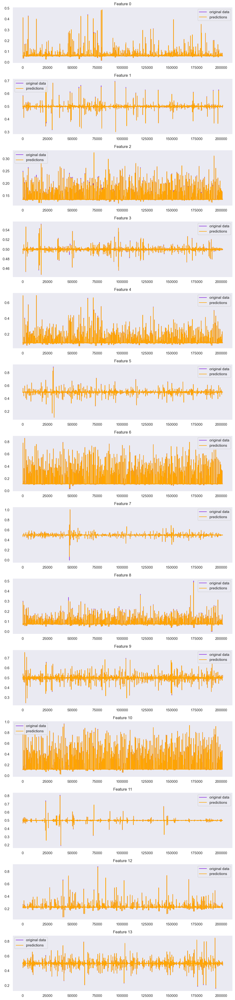

Epoch: 121  train loss: 0.00017426158098520682  val loss: 4.186684801682854e-05  time: 146.6063220500946 


Epoch: 122  train loss: 0.0001590438784402686  val loss: 2.7668353834874608e-05  time: 146.07283353805542 


Epoch: 123  train loss: 0.0001624228172967996  val loss: 6.373406606821482e-05  time: 145.8548288345337 


Epoch: 124  train loss: 0.0001559773134049392  val loss: 4.1249265438903894e-05  time: 147.05674958229065 


Epoch: 125  train loss: 0.00016933141211512338  val loss: 3.72325770290231e-05  time: 145.61208081245422 


Epoch: 126  train loss: 0.00015787455078943458  val loss: 2.8174597163784152e-05  time: 146.07396459579468 


Epoch: 127  train loss: 0.00016833469787534705  val loss: 2.6418203781480565e-05  time: 145.69256949424744 


Epoch: 128  train loss: 0.0001516599292942992  val loss: 3.003260145060833e-05  time: 145.756338596344 


Epoch: 129  train loss: 0.00016641325128805693  val loss: 4.374161958199471e-05  time: 145.72173976898193 


Epoch: 130  train loss: 0.00015077728805530205  val loss: 3.06987844782053e-05  time: 145.65336227416992 


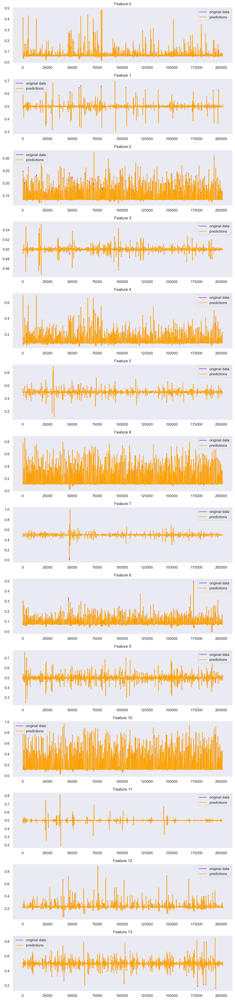

Epoch: 131  train loss: 0.00016628683119205743  val loss: 4.200895166576799e-05  time: 146.94734644889832 


Epoch: 132  train loss: 0.00014957273855444508  val loss: 3.585356448424982e-05  time: 145.96000504493713 


Epoch: 133  train loss: 0.00016349345100434947  val loss: 5.182382778218754e-05  time: 145.7187535762787 


Early stopping at epoch 134


In [35]:
model, history = train_model(model, train_loader,val_loader , args.epoch, n_features, args)

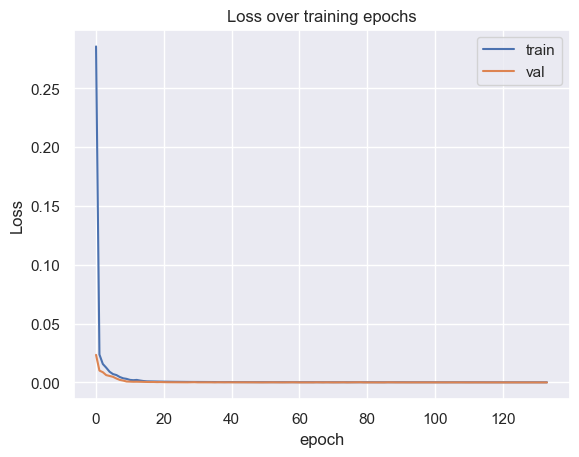

In [36]:
sns.set(style='dark')
plt.plot(history['train'])
plt.plot(history['val'])
plt.ylabel('Loss')
plt.xlabel('epoch')
# plt.ylim(0, 1)
plt.title('Loss over training epochs')
plt.legend(['train','val'])
plt.grid()
plt.savefig('pics/losses.png', dpi=300)
plt.show();

In [37]:
MODEL_PATH = 'lstmae.pth'
torch.save(model, MODEL_PATH)

In [38]:
model = torch.load('lstmae.pth')
model = model.to(args.device)
model

LSTM_AUTO_ENCODER(
  (encoder): Encoder(
    (lstm1): LSTM(14, 256, batch_first=True)
    (lstm2): LSTM(256, 128, batch_first=True)
  )
  (decoder): Decoder(
    (lstm1): LSTM(128, 128, batch_first=True)
    (lstm2): LSTM(128, 256, batch_first=True)
    (output_layer): Linear(in_features=256, out_features=14, bias=True)
  )
)

In [39]:
class Create_dataset(Dataset):
    def __init__(self, data, seq_len=1, batch_size=1):
        self.data = data
        self.seq_len = seq_len
        self.batch_size = batch_size
        self.n_samples, self.n_features = self.data.shape
        self.dataset = self.create_dataset(self.data, batch_size)

    def create_dataset(self, data, batch_size):
        sequences = []
        for i in range(len(data) - self.seq_len + 1):
            sequence = data.iloc[i:i+self.seq_len].values.astype(np.float32)
            sequences.append(torch.from_numpy(sequence))
        return DataLoader(sequences, batch_size=batch_size, shuffle=False)

    def __getitem__(self, index):
        return self.data.iloc[index]

    def __len__(self):
        return len(self.data) - self.seq_len + 1

In [40]:
class encdataset(Dataset):
    def __init__(self, data, seq_len=1, batch_size=1):
        # data load
        self.data = data
        self.features = self.data.values.astype(np.float32)
        self.n_samples, self.n_features = self.data.shape
        self.seq_len = seq_len
        self.train_df = self.data[0:2000000]
        self.val_df = self.data[2000000:]
        
        # создание датасета
        self.train_dataset = self.create_dataset(self.train_df, batch_size)
        self.val_dataset = self.create_dataset(self.val_df, batch_size)

    def create_dataset(self, data, batch_size):
        sequences = []
        for i in range(len(data) - self.seq_len + 1):
            sequence = data[i:i+self.seq_len].values  # Изменение здесь
            sequences.append(torch.from_numpy(sequence))
        dataset = DataLoader(sequences, batch_size=batch_size, shuffle=False)
        return dataset

    def __getitem__(self, index):
        return self.data.iloc[index]

    def __len__(self):
        return self.n_samples


In [41]:
dataset = encdataset(df)
train_loader = dataset.train_dataset
val_loader = dataset.val_dataset
seq_len = dataset.seq_len
n_features = dataset.n_features

In [42]:
anomaly = Create_dataset(anom)
anomaly_loader=anomaly.dataset

In [43]:
anomaly_loader

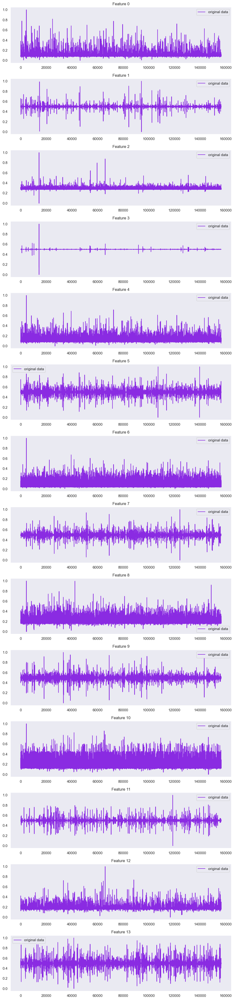

In [44]:
# 1. Извлечь данные из train_loader в виде numpy массива
anom_data = []
for batch in anomaly_loader:
    batch = batch.squeeze(1)  # убираем лишнее измерение
    batch = batch.numpy()  # преобразуем в numpy array
    for seq in batch:
        anom_data.append(seq)
anom_data = np.array(anom_data)

# 2. Перестроить данные в подходящий формат для построения графиков
anom_data = anom_data.reshape(-1, seq_len, n_features)

# 3. Создать подграфики для каждой фичи
fig, axs = plt.subplots(n_features, 1, figsize=(10, n_features * 3))

# 4. Построить график для каждой фичи
for i in range(n_features):
    line, = axs[i].plot(anom_data[:, 0, i], color='blueviolet', label='original data')
    for j in range(1, seq_len):
        axs[i].plot(anom_data[:, j, i], color='blueviolet')
    axs[i].set_title(f'Feature {i}')
    axs[i].legend(handles=[line])  # Добавить легенду

plt.tight_layout()
plt.show()

In [45]:
def predict(model, dataset):
    predictions, losses = [], []
    criterion = nn.MSELoss(reduction='sum').to(args.device)

    with torch.no_grad():
        model = model.eval()
        for seq_true in dataset:
            seq_true = seq_true.to(device=args.device)
            seq_pred = model(seq_true)

            loss = criterion(seq_pred, seq_true)

            predictions.append(seq_pred.cpu().numpy())
            losses.append(loss.item())
    return predictions, losses

d:\anaconda\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


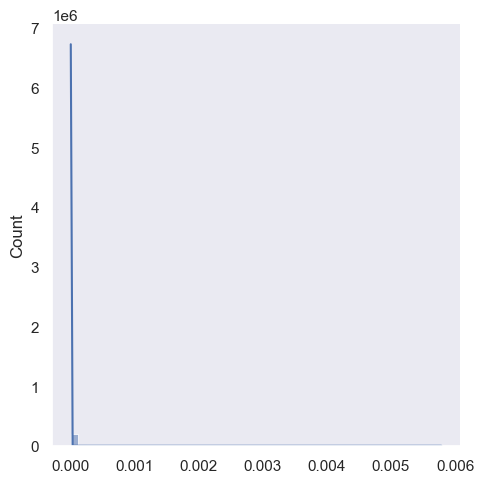

In [46]:
val_pred, val_losses = predict(model,val_loader)
sns.displot(val_losses, bins=50, kde=True);

d:\anaconda\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


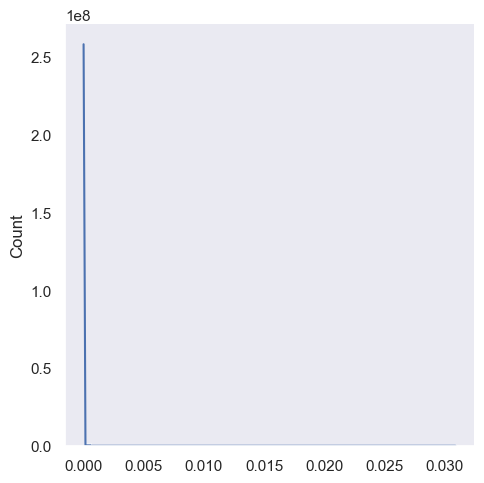

In [47]:
train_pred, train_losses = predict(model,train_loader)
sns.displot(train_losses, bins=50, kde=True);

d:\anaconda\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


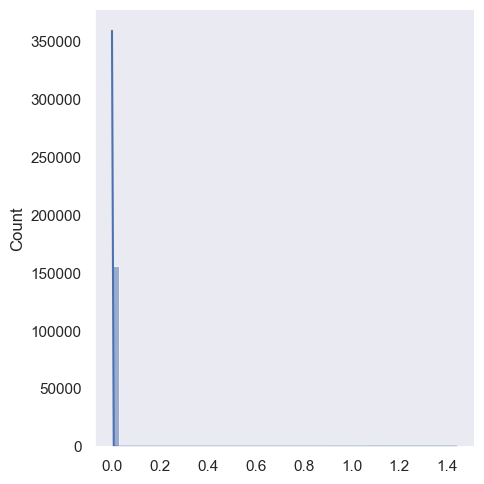

In [48]:
anom_pred, anom_losses = predict(model,anomaly_loader)
sns.displot(anom_losses, bins=50, kde=True);

In [49]:
len(anom_losses)+len(val_losses)

357999

In [50]:
len(val_loader)

201368

In [64]:
Threshold = 0.00001

In [130]:
corect_train= sum(l<= Threshold for l in train_losses)
print(f'Correct normal predictions: {corect_train}/{len(train_loader)}')
detected_train=corect_train/len(train_loader)
print(f'correct detected normal: {detected_train}')
corect_normal= sum(l<= Threshold for l in val_losses)
print(f'Correct normal predictions: {corect_normal}/{len(val_loader)}')
detected_normal=corect_normal/len(val_loader)
print(f'correct detected normal: {detected_normal}')
corect_anomaly= sum(l> Threshold for l in anom_losses)
print(f'Correct anomaly predictions: {corect_anomaly}/{len(anomaly_loader)}')
detected_anomaly=corect_anomaly/len(anomaly_loader)
print(f'correct detected anomaly: {detected_anomaly}')

Correct normal predictions: 1996343/2000000
correct detected normal: 0.9981715
Correct normal predictions: 201071/201368
correct detected normal: 0.9985250883953757
Correct anomaly predictions: 156631/156631
correct detected anomaly: 1.0


In [53]:
df['Failure']=0
anom['Failure']=1

In [152]:
th=np.arange( 0.00001,0.005,1e-5)
th.shape

(499,)

In [153]:
corect_normal= sum(l<= th for l in val_losses)
print(f'Correct normal predictions: {corect_normal}/{len(val_loader)}')
detected_normal=corect_normal/len(val_loader)
print(f'correct detected normal: {detected_normal}')
corect_anomaly= sum(l> th for l in anom_losses)
print(f'Correct anomaly predictions: {corect_anomaly}/{len(anomaly_loader)}')
detected_anomaly=corect_anomaly/len(anomaly_loader)
print(f'correct detected anomaly: {detected_anomaly}')

Correct normal predictions: [201071 201189 201225 201251 201272 201283 201291 201298 201305 201314
 201319 201327 201331 201332 201334 201337 201339 201344 201345 201346
 201352 201353 201355 201355 201357 201358 201359 201360 201360 201360
 201360 201361 201361 201361 201361 201361 201362 201362 201362 201363
 201363 201363 201363 201363 201363 201363 201363 201363 201363 201363
 201363 201363 201364 201364 201365 201365 201365 201365 201365 201365
 201365 201365 201365 201365 201365 201365 201365 201365 201365 201365
 201365 201365 201365 201365 201365 201365 201365 201365 201365 201365
 201365 201365 201365 201365 201365 201365 201365 201365 201365 201365
 201365 201365 201365 201365 201365 201365 201365 201365 201365 201365
 201365 201365 201365 201365 201365 201365 201365 201365 201365 201366
 201366 201366 201366 201366 201366 201366 201366 201366 201366 201366
 201366 201366 201366 201366 201366 201366 201366 201366 201366 201366
 201366 201366 201366 201366 201366 201366 201366

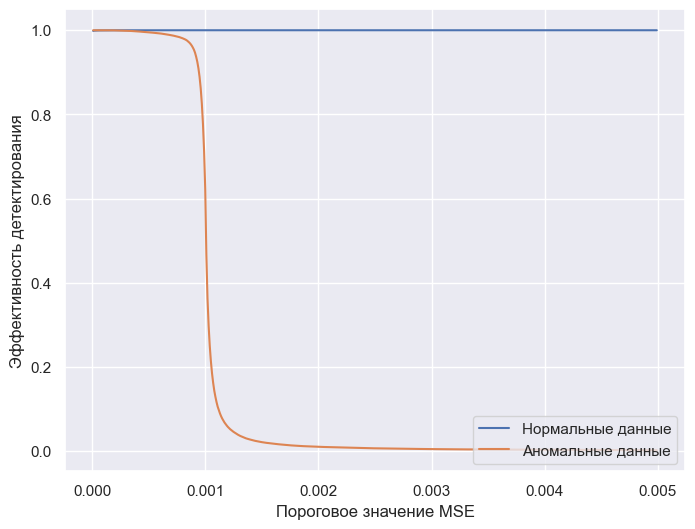

In [154]:
sns.set(style='dark')
plt.figure(figsize=(8,6))
plt.plot(th ,detected_normal)
plt.plot(th ,detected_anomaly)
plt.ylabel('Эффективность детектирования')
plt.xlabel('Пороговое значение MSE')
# plt.ylim(0, 1)
# plt.title('Зависимость эффективности модели от ошибки реконструкции по MSE')
plt.legend(['Нормальные данные','Аномальные данные'], loc='lower right')
plt.grid()
plt.savefig('pics/threshhold.png', dpi=300)
plt.show();

In [57]:
combined_df = np.concatenate((df, anom), axis=0)

In [58]:
combined_df = pd.DataFrame(combined_df, columns=df.columns)

In [59]:
combined_df.shape

(2357999, 15)

In [60]:
X=combined_df.drop(['Failure'], axis=1)
y=combined_df['Failure']

In [107]:
combo = Create_dataset(X)
combo_loader=combo.dataset

In [108]:
losses=val_losses+train_losses+ anom_losses

In [132]:
Threshold = 0.0001

In [133]:
score = pd.DataFrame(index = X.index)
score['Loss'] = losses
score['Threshold'] = Threshold
score['Anomaly'] = score['Loss'] > score['Threshold']

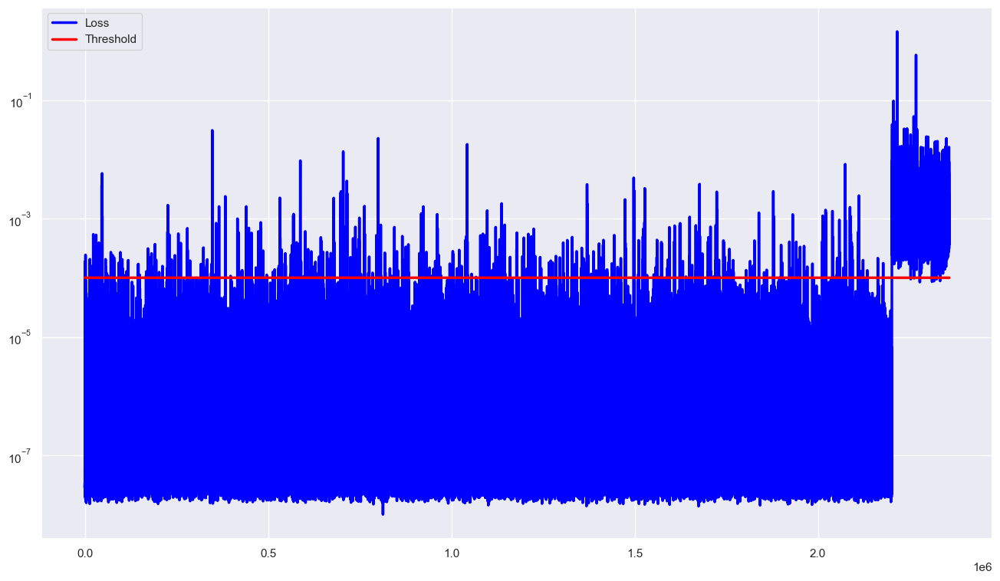

In [134]:
sns.set(style='dark')
score.plot(logy=True, figsize=(16,9), color=['blue','red'],linewidth=2.5)
plt.savefig('pics/score_plot_failure.png', dpi=300)
plt.grid()
# Отображение графика
plt.show()

In [143]:
corect_normal= sum(l<= Threshold for l in val_losses)
print(f'Correct normal predictions: {corect_normal}/{len(val_loader)}')
detected_normal=corect_normal/len(val_loader)
print(f'correct detected normal: {detected_normal}')
corect_anomaly= sum(l> Threshold for l in anom_losses)
print(f'Correct anomaly predictions: {corect_anomaly}/{len(anomaly_loader)}')
detected_anomaly=corect_anomaly/len(anomaly_loader)
print(f'correct detected anomaly: {detected_anomaly}')

Correct normal predictions: 201314/201368
correct detected normal: 0.9997318342537047
Correct anomaly predictions: 156624/156631
correct detected anomaly: 0.9999553089745964


In [135]:
from sklearn.metrics import  roc_auc_score, classification_report, accuracy_score, f1_score, precision_score, recall_score

In [136]:
def metrics(y_true,y_pred):
    acc=accuracy_score(y_true, y_pred)
    f1=f1_score(y_true, y_pred, average='binary')
    roc_auc=roc_auc_score(y_true, y_pred)
    precision=precision_score(y_true, y_pred)
    recall=recall_score(y_true, y_pred)
    
        # Создание DataFrame
    metrics_df = pd.DataFrame({
        'Метрика': ['Recall', 'Precision', 'F1', 'roc_auc', 'accuracy', 'detected normal', 'detected anomaly'],
        'Значение': [recall, precision, f1, roc_auc, acc, detected_normal, detected_anomaly]
    })

    # # Сохранение DataFrame в CSV
    # metrics_df.to_csv('metrics.csv', index=False)
    return metrics_df

In [137]:
score.head()

,Loss,Threshold,Anomaly
0,3.072922e-08,0.0001,False
1,2.954214e-08,0.0001,False
2,3.065885e-08,0.0001,False
3,2.944972e-08,0.0001,False
4,3.235368e-08,0.0001,False


In [138]:
y.head()

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Failure, dtype: float64

In [139]:
y.shape

(2357999,)

In [140]:
score['Anomaly'].shape

(2357999,)

In [141]:
score['Anomaly']=score['Anomaly'].astype(int)

In [144]:
metrics(y, score['Anomaly'])


,Метрика,Значение
0,Recall,0.999955
1,Precision,0.996032
2,F1,0.997990
3,roc_auc,0.999836
4,accuracy,0.999732
5,detected normal,0.999732
6,detected anomaly,0.999955


In [ ]:
score['Anomaly']

0         0
1         0
2         0
3         0
4         0
         ..
357994    1
357995    1
357996    1
357997    1
357998    1
Name: Anomaly, Length: 357999, dtype: int32

In [160]:
# Добавление колонки Anomaly_count
def count_consecutive_anomalies(anomalies):
    count = 0
    counts = []
    for anomaly in anomalies:
        if anomaly == 1:
            count += 1
        else:
            count = 0
        counts.append(count)
    return counts

score['Anomaly_count'] = count_consecutive_anomalies(score['Anomaly'].values)

score[2000000:]

,Loss,Threshold,Anomaly,Anomaly_count,daysToFailure
2000000,3.269946e-08,0.0001,0,0,277
2000001,2.913726e-08,0.0001,0,0,276
2000002,3.243343e-08,0.0001,0,0,275
2000003,3.168554e-08,0.0001,0,0,274
2000004,2.984737e-08,0.0001,0,0,273
...,...,...,...,...,...
2357994,1.020362e-03,0.0001,1,25116,21
2357995,1.021212e-03,0.0001,1,25117,20
2357996,1.021617e-03,0.0001,1,25118,19
2357997,1.027214e-03,0.0001,1,25119,18


In [156]:
score['daysToFailure'] = pd.concat([time_df, time_anom], ignore_index=True)

In [72]:
test_df=pd.read_csv('0a2dbfa5.csv')
test_df.head()

,SK_Well,Failure1_CulpritCause,Failure2_CulpritCause,Failure3_CulpritCause,Failure4_CulpritCause,Failure5_CulpritCause,Failure6_CulpritCause,Failure7_CulpritCause,MeasureMRM12,MeasureMRM142,MeasureMRM143,MeasureMRM187,MeasureMRM188,MeasureMRM219,daysToFailure,MeasureMRM204
0,0a2dbfa5,Неизвестно,Старение изоляции кабеля,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,16.0,8.0,21.4,62.1,36.0,9999.0,878,0.3
1,0a2dbfa5,Неизвестно,Старение изоляции кабеля,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,16.0,8.0,21.4,61.8,36.0,9999.0,877,0.0
2,0a2dbfa5,Неизвестно,Старение изоляции кабеля,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,16.0,8.0,21.3,62.1,36.0,9999.0,876,0.2
3,0a2dbfa5,Неизвестно,Старение изоляции кабеля,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,16.0,8.0,21.5,61.8,36.0,9999.0,875,0.0
4,0a2dbfa5,Неизвестно,Старение изоляции кабеля,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,15.0,7.8,21.6,62.0,36.0,9999.0,874,0.0


In [73]:
from scipy.fft import fft, ifft

In [74]:
def apply_fft(data, columns):
    # Применяем FFT только к указанным столбцам
    fft_features = {}
    for column in columns:
        if column in data.columns:
            # Преобразуем данные в числовой тип, игнорируя ошибки
            numeric_data = pd.to_numeric(data[column], errors='coerce').fillna(0).to_numpy()
            if numeric_data.ndim == 1:  # Проверяем, что это одномерный массив
                fft_result = fft(numeric_data)
                # Извлекаем реальные и мнимые части
                fft_real = np.real(fft_result)
                fft_imag = np.imag(fft_result)
                # Добавляем результаты FFT в словарь
                fft_features[f'{column}_fft_real'] = fft_real
                fft_features[f'{column}_fft_imag'] = fft_imag
    return pd.DataFrame(fft_features)

In [90]:
fft_test=apply_fft(test_df, test_df[['MeasureMRM12', 'MeasureMRM142', 'MeasureMRM143', 'MeasureMRM187', 
               'MeasureMRM188', 'MeasureMRM219', 'MeasureMRM204']] )

In [91]:
fft_test=fft_test[['MeasureMRM12_fft_real',
       'MeasureMRM12_fft_imag', 'MeasureMRM142_fft_real',
       'MeasureMRM142_fft_imag', 'MeasureMRM143_fft_real',
       'MeasureMRM143_fft_imag', 'MeasureMRM187_fft_real',
       'MeasureMRM187_fft_imag', 'MeasureMRM188_fft_real',
       'MeasureMRM188_fft_imag', 'MeasureMRM219_fft_real',
       'MeasureMRM219_fft_imag', 'MeasureMRM204_fft_real',
       'MeasureMRM204_fft_imag']]

In [92]:
fft_test= pd.DataFrame(scaler.fit_transform(fft_test), columns=columns)

In [93]:
test = Create_dataset(fft_test)
test_loader=test.dataset

In [94]:
# # 1. Извлечь данные из train_loader в виде numpy массива
# test_data = []
# for batch in test_loader:
#     batch = batch.squeeze(1)  # убираем лишнее измерение
#     batch = batch.numpy()  # преобразуем в numpy array
#     for seq in batch:
#         test_data.append(seq)
# test_data = np.array(test_data)

# # 2. Перестроить данные в подходящий формат для построения графиков
# test_data = test_data.reshape(-1, seq_len, n_features)

# # 3. Создать подграфики для каждой фичи
# fig, axs = plt.subplots(n_features, 1, figsize=(10, n_features * 3))

# # 4. Построить график для каждой фичи
# for i in range(n_features):
#     line, = axs[i].plot(test_data[:, 0, i], color='blueviolet', label='original data')
#     for j in range(1, seq_len):
#         axs[i].plot(test_data[:, j, i], color='blueviolet')
#     axs[i].set_title(f'Feature {i}')
#     axs[i].legend(handles=[line])  # Добавить легенду

# plt.tight_layout()
# plt.show()

In [95]:
test_pred, test_losses = predict(model,test_loader)

In [104]:
Threshold=0.03

In [105]:
score_test = pd.DataFrame(index = test_df.index)
score_test['Loss'] = test_losses
score_test['Threshold'] = Threshold
score_test['Anomaly'] = score_test['Loss'] > score_test['Threshold']

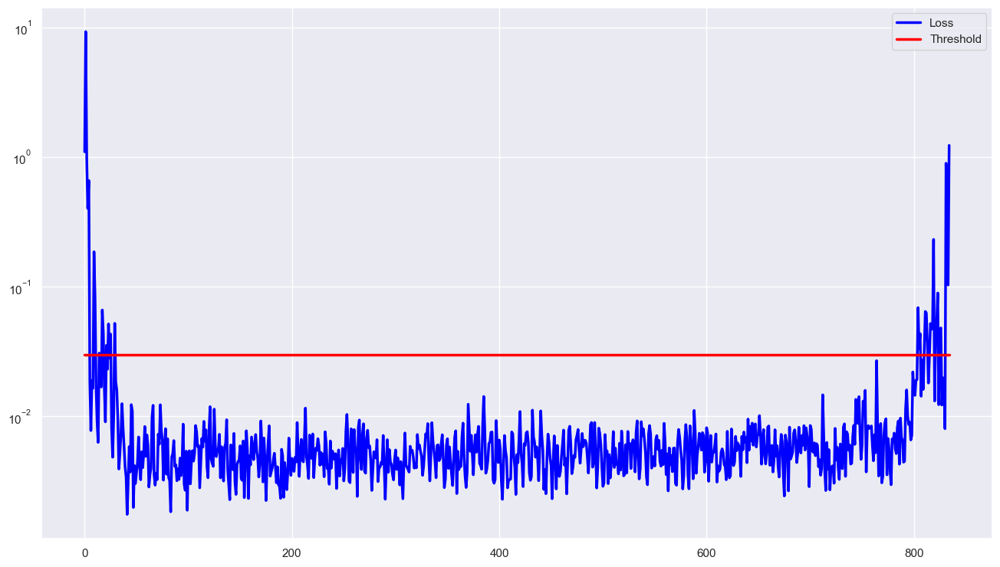

In [106]:
sns.set(style='dark')
score_test.plot(logy=True, figsize=(16,9), color=['blue','red'],linewidth=2.5)
plt.savefig('score_plot_test_all.png', dpi=300)
plt.grid()
# Отображение графика
plt.show()

In [ ]:
score_test.head()

,Loss,Threshold,Anomaly
0,0.210630,0.04,True
1,1.241671,0.04,True
2,0.064254,0.04,True
3,0.429794,0.04,True
4,0.332998,0.04,True


In [ ]:
test_pred

[array([[[0.7466179 , 0.5370014 , 0.7718675 , 0.5710201 , 0.82243985,
          0.5083873 , 0.85545474, 0.52480924, 0.9220641 , 0.4649948 ,
          0.8908392 , 0.5395917 , 0.922294  , 0.5896807 ]]], dtype=float32),
 array([[[ 0.04573432,  0.6912813 ,  0.01483966,  0.9980248 ,
           0.10726873,  1.1891254 ,  0.18026376,  1.2376612 ,
           0.37589556,  0.6451477 ,  0.23371312, -0.5805526 ,
          -0.03036474,  0.9642813 ]]], dtype=float32),
 array([[[-0.0022724 ,  0.24434045,  0.07157364,  0.9307628 ,
          -0.04520517,  0.4318267 ,  0.00272322,  0.19746044,
           0.22791225,  0.32584286,  0.0167546 ,  0.2436294 ,
           0.3931905 ,  0.5272474 ]]], dtype=float32),
 array([[[-0.0639682 ,  0.08895028,  0.12175287,  0.8387627 ,
           0.19231546,  0.66787016, -0.3124107 ,  0.048354  ,
           0.26611722,  1.1802844 ,  0.25722843,  0.36713198,
           0.5402955 ,  0.094419  ]]], dtype=float32),
 array([[[ 0.06681877,  1.4042056 ,  0.11329817,  0.6163742 

In [ ]:
# Функция для восстановления временных рядов
def restore_time_series(predictions, columns):
    restored_columns = {}
    for column in columns:
        real_col = f'{column}_fft_real'
        imag_col = f'{column}_fft_imag'
        
        if real_col in predictions and imag_col in predictions:
            fft_real = predictions[real_col].to_numpy()
            fft_imag = predictions[imag_col].to_numpy()
            restored_columns[column] = apply_ifft(fft_real, fft_imag)
    return pd.DataFrame(restored_columns)

In [ ]:
# Преобразование предсказаний в массив NumPy
predictions_np = np.array(test_pred).reshape(-1, len(fft_test.columns))

# Восстановление временных рядов
restored_df = restore_time_series(predictions_np, columns)

C:\Users\пользователь\AppData\Local\Temp\ipykernel_12568\208223594.py:8: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if real_col in predictions and imag_col in predictions:


In [ ]:
predictions_np.shape

(600, 14)

In [ ]:
predictions_df

,MeasureMRM12_fft_real,MeasureMRM12_fft_imag,MeasureMRM142_fft_real,MeasureMRM142_fft_imag,MeasureMRM143_fft_real,MeasureMRM143_fft_imag,MeasureMRM187_fft_real,MeasureMRM187_fft_imag,MeasureMRM188_fft_real,MeasureMRM188_fft_imag,MeasureMRM219_fft_real,MeasureMRM219_fft_imag,MeasureMRM204_fft_real,MeasureMRM204_fft_imag
0,0.746618,0.537001,0.771868,0.571020,0.822440,0.508387,0.855455,0.524809,0.922064,0.464995,0.890839,0.539592,0.922294,0.589681
1,0.045734,0.691281,0.014840,0.998025,0.107269,1.189125,0.180264,1.237661,0.375896,0.645148,0.233713,-0.580553,-0.030365,0.964281
2,-0.002272,0.244340,0.071574,0.930763,-0.045205,0.431827,0.002723,0.197460,0.227912,0.325843,0.016755,0.243629,0.393191,0.527247
3,-0.063968,0.088950,0.121753,0.838763,0.192315,0.667870,-0.312411,0.048354,0.266117,1.180284,0.257228,0.367132,0.540295,0.094419
4,0.066819,1.404206,0.113298,0.616374,0.109409,0.103780,0.147009,-0.059794,0.188630,0.593071,0.058070,0.516466,0.465609,0.567817
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,0.055703,0.492270,0.023902,0.450032,0.056408,0.483926,0.088204,0.552719,0.063289,0.529545,0.113843,0.506250,0.361899,0.510014
596,0.059959,0.508506,0.037441,0.509999,0.054663,0.449841,0.090378,0.508835,0.064828,0.536396,0.128226,0.585660,0.383319,0.548525
597,0.064325,0.494095,0.037022,0.495199,0.052660,0.441483,0.092842,0.523040,0.058896,0.539929,0.119090,0.561181,0.386399,0.491764
598,0.070587,0.488660,0.021764,0.479136,0.058850,0.428362,0.094883,0.519644,0.066926,0.498630,0.098945,0.493826,0.371291,0.545918


In [ ]:
restored_df.shape

(0, 0)

In [ ]:
# combo_data_np = torch.cat([batch for batch in combo_loader], dim=0).detach().cpu().numpy()

# # 2. Перестроить данные в подходящий формат для построения графиков
# combo_data_np = combo_data_np.reshape(-1, seq_len, n_features)

# # 3. Получить предсказания модели
# preds = []
# with torch.no_grad():
#     model = model.eval()
#     for seq_true in combo_loader:
#         seq_true = seq_true.to(args.device)
#         seq_true = seq_true.reshape((-1, seq_len, n_features))

#         seq_pred = model(seq_true)
#         preds.append(seq_pred.cpu().numpy())
# preds = np.concatenate(preds, axis=0)

# # 4. Создать подграфики для каждой фичи
# fig, axs = plt.subplots(n_features, 1, figsize=(10, n_features * 3))

# # 5. Построить график для каждой фичи
# for i in range(n_features):
    

#     line2, = axs[i].plot(preds[:, 0, i], color='orange', label='predictions')
#     line1, = axs[i].plot(combo_data_np[:, 0, i], color='blueviolet', label='original data')
#     for j in range(1, seq_len):
#         axs[i].plot(combo_data_np[:, j, i], color='blueviolet')
#         axs[i].plot(preds[:, j, i], color='orange')
#     axs[i].set_title(f'Feature {i}')
#     axs[i].legend(handles=[line1, line2])
# # plt.savefig('preds/original 3d.png', dpi=300)
# plt.tight_layout()

# plt.show()
